In [32]:
import sys
import importlib
import os
# make the module available from the src directory
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [33]:
from src.dataLoaders.PatientDataLoader import PatientDataProcessor
importlib.reload(sys.modules['src.dataLoaders.PatientDataLoader'])

<module 'src.dataLoaders.PatientDataLoader' from '/Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/PatientDataLoader.py'>

In [34]:
meta_folder = 'OAIData21/'
data_path = '../datasets/meta_data/' + meta_folder

processor = PatientDataProcessor(base_path=data_path)
meta_data = processor.load_all_clinical_data(labels=["WOMKP"])

In [100]:
from src.transformers.TensorLoaderTransfomer import TensorLoader
from monai.transforms import Compose, LoadImaged, EnsureChannelFirstD, ScaleIntensityd, ToTensord, ResizeD, Lambdad, NormalizeIntensityD

from src.transformers.SliceTransformer import SliceAggregateTransform
importlib.reload(sys.modules['src.transformers.SliceTransformer'])

# importlib.reload(sys.modules['src.transformers.TensorLoaderTransfomer'])
# transforms = [
#         LoadImaged(keys=["image"]),
#         SliceAggregateTransform(keys=["image"], slices=9),
#         ResizeD(keys=["image"], spatial_size=(384, 384, 384)),
#         ScaleIntensityd(keys=["image"], minv=0.0, maxv=1.0, factor=1.0),
#         NormalizeIntensityD(keys=["image"], nonzero=True, channel_wise=True),
#         ToTensord(keys=["image"])
#     ]

custom_transforms = [SliceAggregateTransform(keys=["image"], slices_from_each_view=3, views=["coronal"])]


In [101]:
from src.dataLoaders.NiftiDataLoader2 import NiftiDataLoader
importlib.reload(sys.modules['src.dataLoaders.NiftiDataLoader2'])

<module 'src.dataLoaders.NiftiDataLoader2' from '/Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/NiftiDataLoader2.py'>

In [102]:
dataset = 'niftiShort'
data_path = '../datasets/nifti/'
data_dir = f'{data_path}{dataset}'

# data_dir = 'C:/Users/askel/Downloads/NIFTY/NIFTY/'
# max = 8876
dim = 384
data_loader = NiftiDataLoader(data_dir=data_dir, 
                              batch_size=32,
                              meta_data_loader=processor,
                              spatial_resize=(dim, dim, dim),
                              cache_rate=0.5, 
                              replace_rate=1,
                              custom_transforms=custom_transforms
                              )
# data_loader.load_data(visit_no=visit, subset_size=2058, cache="standard")
# data_loader.load_data(subset_size=84, cache="standard")
#data_loader.load_data(subset_size=4400, cache="standard")
# data_loader.load_data(subset_size=8875, cache="standard")

data_loader.load_data(cache="standard")

File /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/saved_data_lists/data_list.pkl does not exist.
Data list loaded: False
Using custom sampler: False
File /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/saved_data_lists/data_list.pkl does not exist.
Visits: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
Total images detected: 83
Subset size: 83


Loading dataset: 100%|██████████| 8/8 [00:01<00:00,  4.12it/s]

batch_size: 32


In [93]:
from src.models.medical_models.medical_resnet import MedicalResNetModel
importlib.reload(sys.modules['src.models.medical_models.base_medical'])
importlib.reload(sys.modules['src.models.medical_models.medical_resnet'])


from src.models.medical_models.monai_resnet import MonaiMedicalResNet
importlib.reload(sys.modules['src.models.medical_models.monai_resnet'])

from src.models.medical_models.combined_medical import MedicalCombinedResNetModel
importlib.reload(sys.modules['src.models.medical_models.combined_medical'])

# from src.models.medical_models.combined_medical_old import MedicalCombinedResNetModel
# importlib.reload(sys.modules['src.models.medical_models.combined_medical_old'])

# from src.models.medical_models.adaptive_slicing_medical_resnet import AdaptiveMedicalResNetModel
# importlib.reload(sys.modules['src.models.medical_models.adaptive_slicing_medical_resnet'])

<module 'src.models.medical_models.combined_medical' from '/Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/models/medical_models/combined_medical.py'>

In [103]:
# Create a model instance
fast_model = MedicalResNetModel(
    num_epochs=50,
    learning_rate=0.001,
    weight_decay=1e-4,
    data_loader=data_loader,
    # dropout_rate=0.1,
    depth=18
    #pretrained=False
)

# model.load_model('MedicalResNetModel_18_6212_epoch_38.pth')
fast_model.train()
fast_model.evaluate()

Data loader train loader:  3 65
Image spatial dimensions:  torch.Size([32, 3, 384, 384])
Number of input channels:  3
GPU:  mps:0
Number of training images: 65
Outputs:  torch.Size([8, 1])
Epoch 1/50, Train Loss: 3.952065428098043, Val Loss: 8.476814270019531, R^2 Score: -0.4904290437698364, P-value: 1.0
Model saved at /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/models/medical_models/saved_models/MedicalResNetModel_18_65_height_torch.Size([32, 3, 384, 384])_epoch_1_val_8.48_r2_0.pth
Outputs:  torch.Size([8, 1])
Epoch 2/50, Train Loss: 4.928179065386455, Val Loss: 159.66371154785156, R^2 Score: -27.072738647460938, P-value: 1.0
Outputs:  torch.Size([8, 1])
Epoch 3/50, Train Loss: 6.19362751642863, Val Loss: 195.0871124267578, R^2 Score: -33.30103302001953, P-value: 1.0
Outputs:  torch.Size([8, 1])
Epoch 4/50, Train Loss: 4.322176059087117, Val Loss: 160.00906372070312, R^2 Score: -27.133460998535156, P-value: 1.0
Outputs:  torch.Size([8

In [21]:
fusion_model = MedicalCombinedResNetModel(
    num_epochs=50,
    learning_rate=0.01,
    weight_decay=1e-4,
    data_loader=data_loader,
    dropout_rate=0.1,
    depth=18
    #pretrained=False
)

# fusion_model.train()
# fusion_model.evaluate()

Data loader train loader:  3 65
Image spatial dimensions:  torch.Size([32, 9, 128, 128])
Number of input channels:  9
model:  <generator object Module.parameters at 0x1b6604c80>
GPU:  mps:0


In [22]:
# fusion_model.load_model("MedicalCombinedResNetModel_18_800_height_torch.Size([32, 9, 256, 256])_epoch_33_val_4.26_r2_0.87.pth")

# fusion_model.load_model("MedicalCombinedResNetModel_18_800_height_torch.Size([32, 9, 256, 256])_epoch_33_val_4.26_r2_0.87.pth")
fusion_model.load_model("MedicalCombinedResNetModel_18_7095_height_384_epoch_9_val_7.5_r2_7.5.pth")
fusion_model.train()


fusion_model.evaluate()


Model loaded from /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/models/medical_models/saved_models/MedicalCombinedResNetModel_18_7095_height_384_epoch_9_val_7.5_r2_7.5.pth, epoch: 9, val_loss: 7.495371665273394
Number of training images: 65
Outputs:  torch.Size([8, 1])
Epoch 1/50, Train Loss: 10.335468848546347, Val Loss: 11.874283790588379, R^2 Score: -1.0877861976623535, P-value: 1.0
Model saved at /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/models/medical_models/saved_models/MedicalCombinedResNetModel_18_65_height_torch.Size([32, 9, 128, 128])_epoch_1_val_11.87_r2_0.pth
Outputs:  torch.Size([8, 1])
Epoch 2/50, Train Loss: 2.1813474595546722, Val Loss: 8.520609855651855, R^2 Score: -0.4981292486190796, P-value: 1.0
Model saved at /Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/models/medical_models/saved_models/MedicalCombinedResNetModel_1

In [95]:
from src.XAI.GradCamMedicalCombined import GradCamResnet
importlib.reload(sys.modules['src.XAI.GradCamMedicalCombined'])

from src.XAI.VanillaSaliencyMedical import VanillaSaliency
importlib.reload(sys.modules['src.XAI.VanillaSaliencyMedical'])

<module 'src.XAI.VanillaSaliencyMedical' from '/Users/askelundsgaard/Documents/datalogi/6-semester/Bachelor/XAI-in-Medical-Image-Analysis/src/XAI/VanillaSaliencyMedical.py'>

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


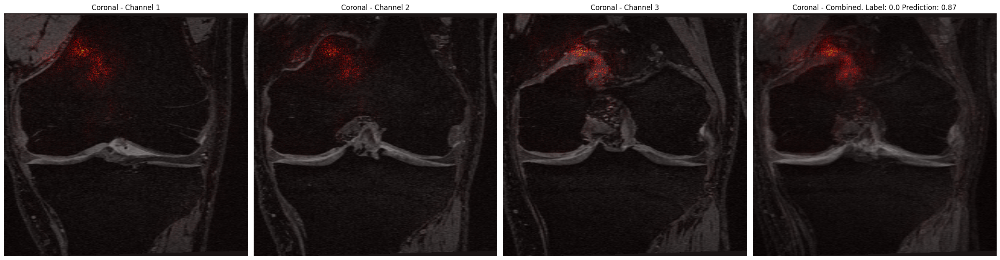

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


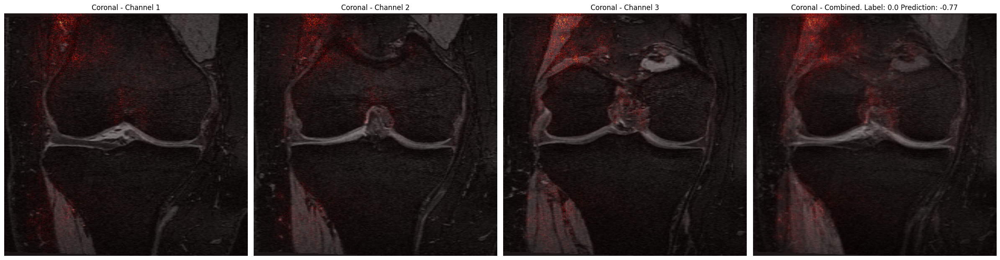

{'WOMKP': 1.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


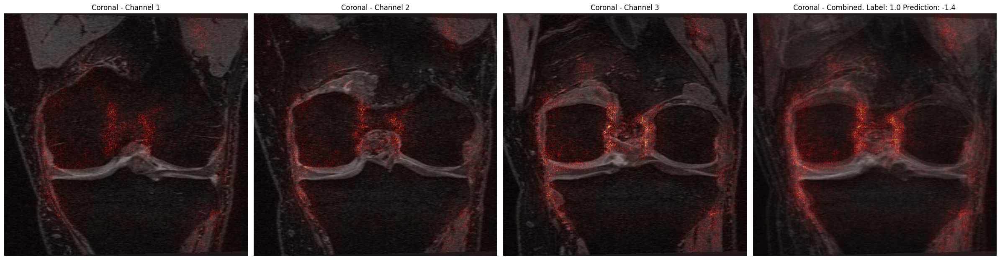

{'WOMKP': 8.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


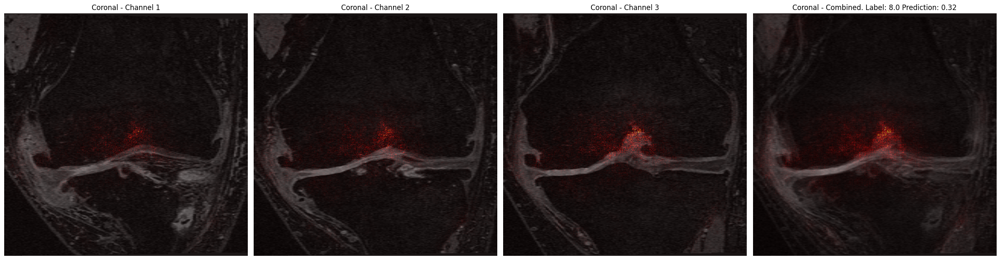

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


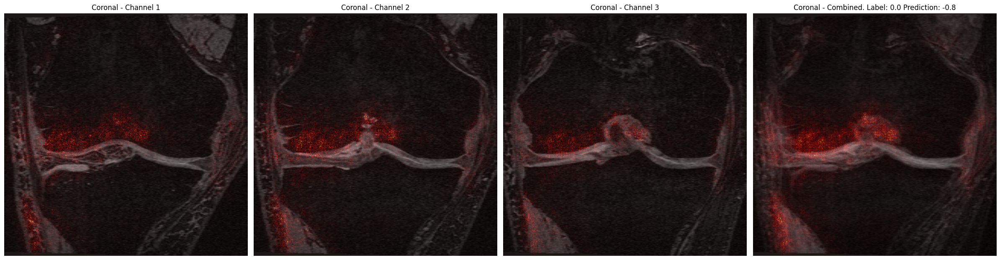

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


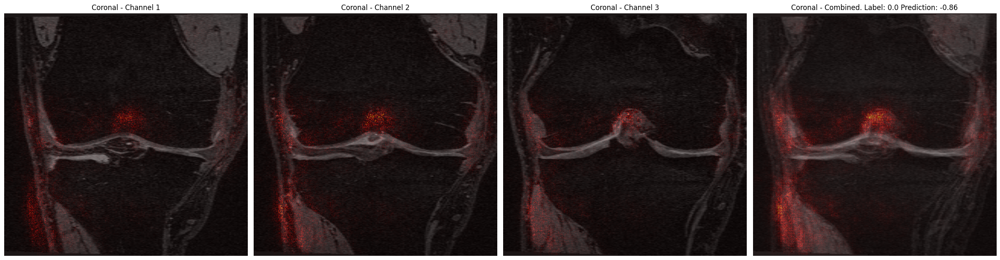

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


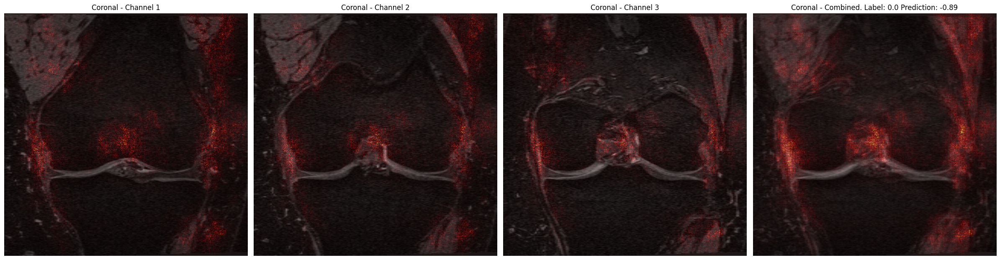

{'WOMKP': 0.0}
saliencies.shape (3, 384, 384)
channels_per_view 3
i 0


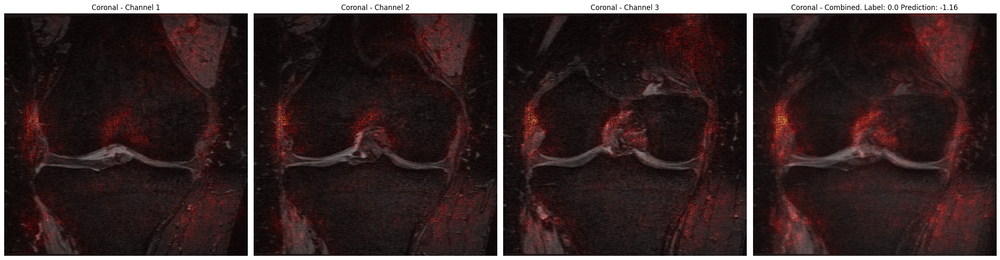

In [96]:
grad_cam = GradCamResnet(modelWrapper=fusion_model)
saliency_fusion = VanillaSaliency(modelWrapper=fusion_model)

single_saliency = VanillaSaliency(modelWrapper=fast_model, views=["Coronal"])
# saliency.get_saliency_maps(image_count=1, save_output=False, save_dir="default")


for i in range(0, 8):
    # grad_cam.generate_map(index=i, use_test_data=False)
    # saliency_fusion.generate_map(index=i, use_test_data=False)
    single_saliency.generate_map(index=i)

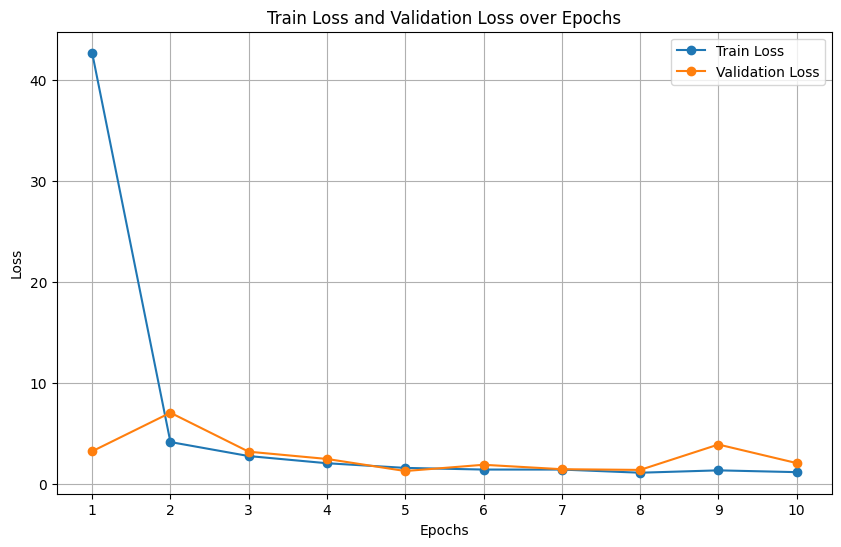

In [14]:
import matplotlib.pyplot as plt

# Data
epochs = list(range(1, 11))
train_loss = [42.742962085723875, 4.141625546932221, 2.7520689334869384, 2.0407947452068327, 
              1.5788128867149354, 1.4134249949455262, 1.4131299614906312, 1.100153112411499, 
              1.3348765921592713, 1.1574740645885468]
val_loss = [3.2245964854955673, 7.04875348508358, 3.1852420419454575, 2.4649068638682365, 
            1.2675845175981522, 1.8881649747490883, 1.448503240942955, 1.3786930590867996, 
            3.8969911262392998, 2.055871047079563]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Train Loss', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', marker='o')

# Labels and Title
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train Loss and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.xticks(epochs)  # Set x-axis to show all epoch numbers

# Show plot
plt.show()